In [14]:
import EddyDetectionV2 as eddy
import oceanspy as ospy
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cmocean.cm as cmo
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.colors import Normalize
from matplotlib.collections import LineCollection
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from matplotlib.colors import SymLogNorm
from tqdm import tqdm
import ast
from matplotlib.animation import FuncAnimation, FFMpegFileWriter
from matplotlib.colors import LinearSegmentedColormap
import pandas as pd

# Set default font size to match LaTeX document
plt.rcParams.update({
    'font.size': 11,       # Default text size
    'axes.titlesize': 10,  # Title size
    'axes.labelsize': 10,  # Axis label size
    'xtick.labelsize': 8, # X-tick label size
    'ytick.labelsize': 8, # Y-tick label size
    'legend.fontsize': 8, # Legend font size
    'figure.titlesize': 12 # Figure title size
})

In [24]:
dfOWsurf = xr.open_dataset('/nird/projects/NS9608K/MSc_EK/Data/Eddies_fullYear.nc')['EddyDetection']
dfOWWM = xr.open_dataset('/nird/projects/NS9608K/MSc_EK/Data/Eddies_fullYear_2.nc')['EddyDetection']

In [22]:
FWC = xr.open_dataset(r'/nird/projects/NS9608K/MSc_EK/Data/FWC_full_domain.nc')['__xarray_dataarray_variable__'].sel(Y=slice(70,75)).sel(X=slice(-22,2))
FWC = FWC.resample(time='D').mean(dim='time')

In [16]:
locMax_surf = pd.read_csv('/nird/projects/NS9608K/MSc_EK/Data/locMAX.csv')
locMin_surf = pd.read_csv('/nird/projects/NS9608K/MSc_EK/Data/locMin.csv')
locMax_WM = pd.read_csv('/nird/projects/NS9608K/MSc_EK/Data/locMAX2.csv')
locMin_WM = pd.read_csv('/nird/projects/NS9608K/MSc_EK/Data/locMin2.csv')

In [20]:
steps = np.arange(np.max(locMin_surf['ID'].values))
Days_pos_surf = [[] for i in steps]
for ID,LAT,LON,TIME in zip(locMax_surf['ID'],locMax_surf['Latitude'],locMax_surf['Longitude'],locMax_surf['Time']):
    Days_pos_surf[int(ID)-1].append([LON,LAT,TIME])
for ID,LAT,LON,TIME in zip(locMin_surf['ID'],locMin_surf['Latitude'],locMin_surf['Longitude'],locMin_surf['Time']):
    Days_pos_surf[int(ID)-1].append([LON,LAT,TIME])


steps = np.arange(np.max(locMin_WM['ID'].values))
Days_pos_WM = [[] for i in steps]
for ID,LAT,LON,TIME in zip(locMax_WM['ID'],locMax_WM['Latitude'],locMax_WM['Longitude'],locMax_WM['Time']):
    Days_pos_WM[int(ID)-1].append([LON,LAT,TIME])
for ID,LAT,LON,TIME in zip(locMin_WM['ID'],locMin_WM['Latitude'],locMin_WM['Longitude'],locMin_WM['Time']):
    Days_pos_WM[int(ID)-1].append([LON,LAT,TIME])

eddies_ID_max_t_surf = locMax_surf.set_index(['Time'])
eddies_ID_min_t_surf = locMin_surf.set_index(['Time'])
eddies_ID_max_t_WM = locMax_WM.set_index(['Time'])
eddies_ID_min_t_WM = locMin_WM.set_index(['Time'])

/tmp/ipykernel_2660985/1126195050.py:32: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for collection in contour.collections:
/tmp/ipykernel_2660985/1126195050.py:60: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for collection in contour.collections:
/tmp/ipykernel_2660985/1126195050.py:89: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for collection in contour.collections:
/tmp/ipykernel_2660985/1126195050.py:117: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for collection in contour.collections:


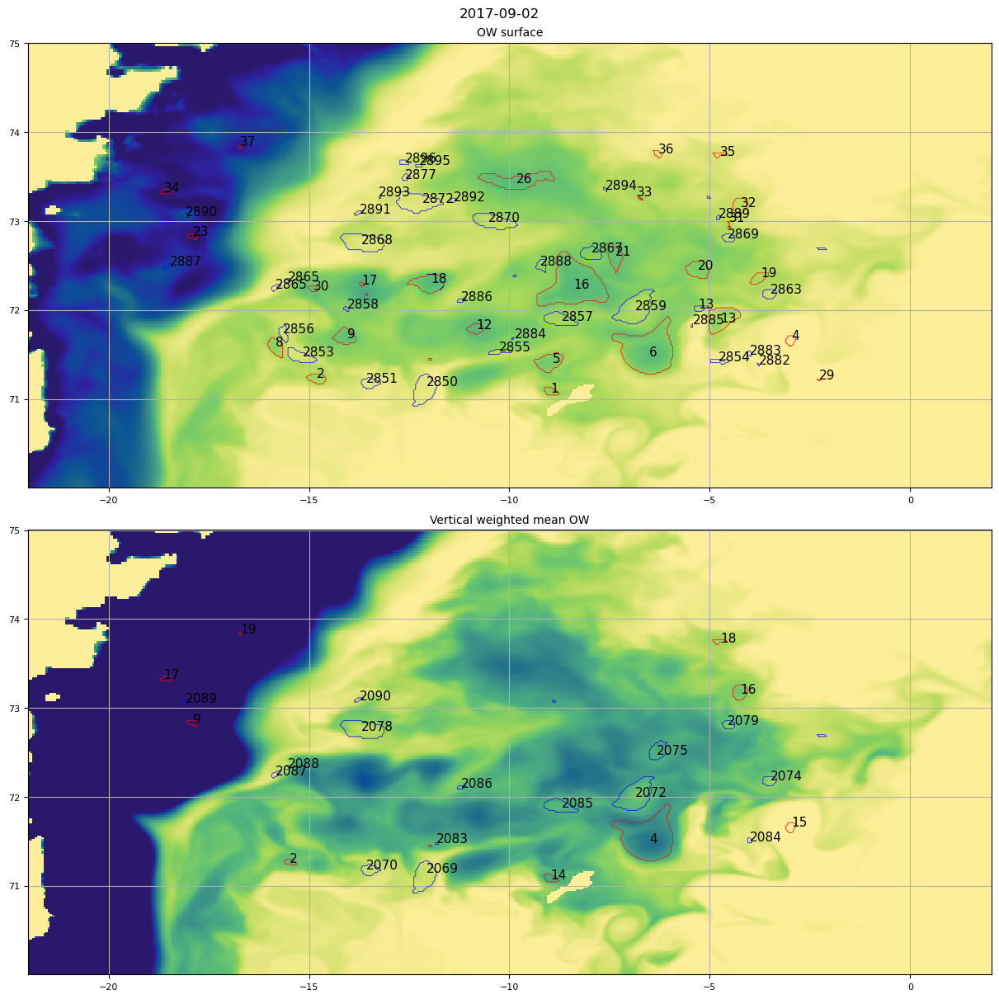

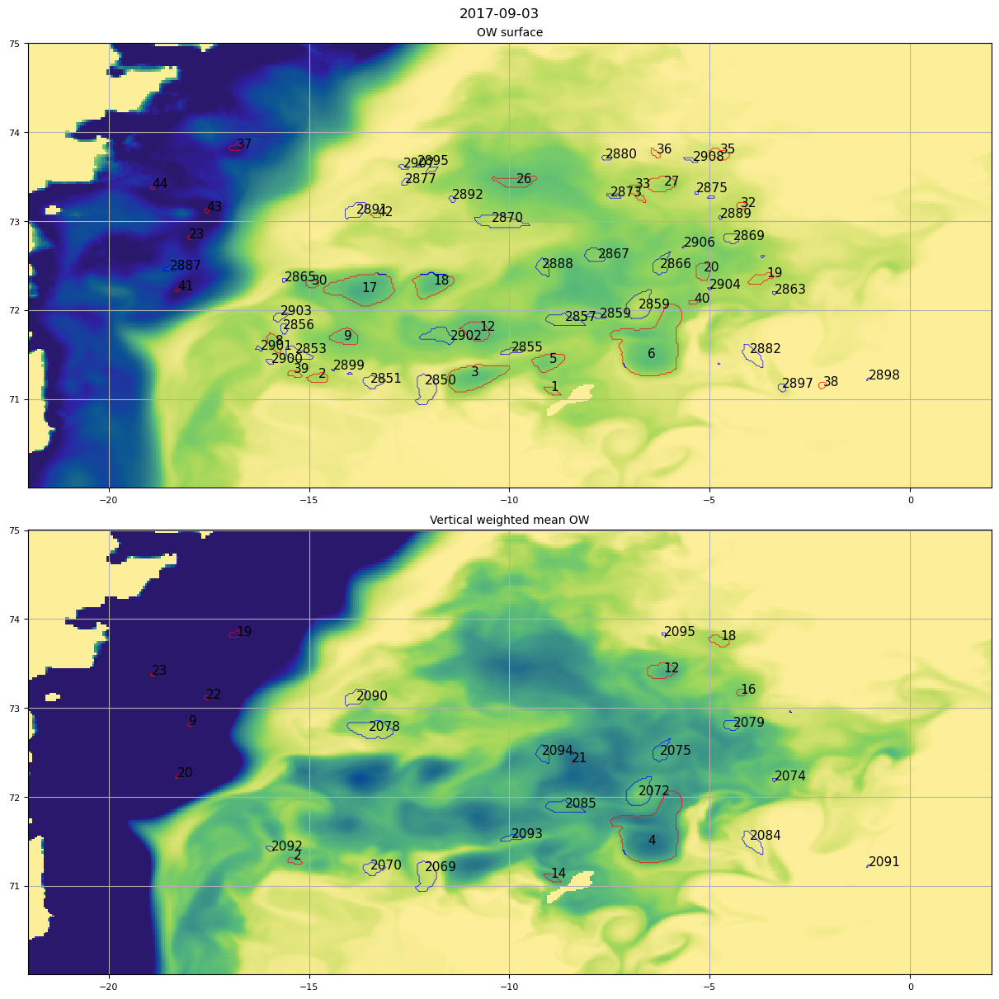

In [35]:
def is_closed_contour(vertices, tol=1e-5):
                distance = np.linalg.norm(vertices[0] - vertices[-1])
                return distance < tol


# Process Contour Paths to Handle Jumps
def process_contour_path(vertices, jump_threshold=0.2):
    segments = []
    current_segment = [vertices[0]]
    
    for i in range(1, len(vertices)):
        if np.linalg.norm(vertices[i] - vertices[i-1]) > jump_threshold:
            segments.append(np.array(current_segment))
            current_segment = [vertices[i]]
        else:
            current_segment.append(vertices[i])
    
    if current_segment:
        segments.append(np.array(current_segment))
    
    return segments

time_ = np.arange(1,3)
for time in time_:
    fig, (ax,ax2) = plt.subplots(2,1,
        figsize=(12,12),layout='constrained'
    )
    contour = ax.contourf(dfOWsurf.X,dfOWsurf.Y,dfOWsurf[time],[0,1],colors='white')
    ax.grid()
    all_contour_points = []

    for collection in contour.collections:
        for path in collection.get_paths():
            # Collect the vertices of the path
            vertices = path.vertices
            all_contour_points.append(vertices)

    processed_contour_segments = []
    for vertices in all_contour_points:
        segments = process_contour_path(vertices)
        processed_contour_segments.extend(segments)
    
    for vertices in processed_contour_segments:
        ax.plot(vertices[:, 0], vertices[:, 1], 'r-', linewidth=0.5)


    data_ID = eddies_ID_max_t_surf.at[time,'ID'].values
    data_LON = eddies_ID_max_t_surf.at[time,'Longitude'].values
    data_LAT = eddies_ID_max_t_surf.at[time,'Latitude'].values
    for i in range(len(data_ID)):
        for vertices in processed_contour_segments:
            region = Path(vertices)
            if region.contains_point((data_LON[i],data_LAT[i])):
                ax.annotate(str(int(data_ID[i])),[data_LON[i],data_LAT[i]])
    
    contour = ax.contourf(dfOWsurf.X,dfOWsurf.Y,dfOWsurf[time],[1.5,2],colors='white')

    all_contour_points = []

    for collection in contour.collections:
        for path in collection.get_paths():
            # Collect the vertices of the path
            vertices = path.vertices
            all_contour_points.append(vertices)

    processed_contour_segments = []
    for vertices in all_contour_points:
        segments = process_contour_path(vertices)
        processed_contour_segments.extend(segments)
    
    for vertices in processed_contour_segments:
        ax.plot(vertices[:, 0], vertices[:, 1], 'b-', linewidth=0.5)

    data_ID = eddies_ID_min_t_surf.at[time,'ID'].values
    data_LON = eddies_ID_min_t_surf.at[time,'Longitude'].values
    data_LAT = eddies_ID_min_t_surf.at[time,'Latitude'].values
    for i in range(len(data_ID)):
        for vertices in processed_contour_segments:
            region = Path(vertices)
            if region.contains_point((data_LON[i],data_LAT[i])):
                ax.annotate(str(int(data_ID[i])),[data_LON[i],data_LAT[i]])
    
    ax.pcolormesh(FWC.X,FWC.Y,FWC[time],cmap=cmo.haline_r,vmin=0,vmax=10)

    contour = ax2.contourf(dfOWWM.X,dfOWWM.Y,dfOWWM[time],[0,1],colors='white')
    ax2.grid()
    all_contour_points = []

    for collection in contour.collections:
        for path in collection.get_paths():
            # Collect the vertices of the path
            vertices = path.vertices
            all_contour_points.append(vertices)

    processed_contour_segments = []
    for vertices in all_contour_points:
        segments = process_contour_path(vertices)
        processed_contour_segments.extend(segments)
    
    for vertices in processed_contour_segments:
        ax2.plot(vertices[:, 0], vertices[:, 1], 'r-', linewidth=0.5)


    data_ID = eddies_ID_max_t_WM.at[time,'ID'].values
    data_LON = eddies_ID_max_t_WM.at[time,'Longitude'].values
    data_LAT = eddies_ID_max_t_WM.at[time,'Latitude'].values
    for i in range(len(data_ID)):
        for vertices in processed_contour_segments:
            region = Path(vertices)
            if region.contains_point((data_LON[i],data_LAT[i])):
                ax2.annotate(str(int(data_ID[i])),[data_LON[i],data_LAT[i]])
    
    contour = ax2.contourf(dfOWWM.X,dfOWWM.Y,dfOWWM[time],[1.5,2],colors='white')

    all_contour_points = []

    for collection in contour.collections:
        for path in collection.get_paths():
            # Collect the vertices of the path
            vertices = path.vertices
            all_contour_points.append(vertices)

    processed_contour_segments = []
    for vertices in all_contour_points:
        segments = process_contour_path(vertices)
        processed_contour_segments.extend(segments)
    
    for vertices in processed_contour_segments:
        ax2.plot(vertices[:, 0], vertices[:, 1], 'b-', linewidth=0.5)

    data_ID = eddies_ID_min_t_WM.at[time,'ID'].values
    data_LON = eddies_ID_min_t_WM.at[time,'Longitude'].values
    data_LAT = eddies_ID_min_t_WM.at[time,'Latitude'].values
    for i in range(len(data_ID)):
        for vertices in processed_contour_segments:
            region = Path(vertices)
            if region.contains_point((data_LON[i],data_LAT[i])):
                ax2.annotate(str(int(data_ID[i])),[data_LON[i],data_LAT[i]])
    
    ax2.pcolormesh(FWC.X,FWC.Y,FWC[time],cmap=cmo.haline_r,vmin=0,vmax=5)

    ax.set_title('OW surface')
    ax2.set_title('Vertical weighted mean OW')
    fig.suptitle(str(FWC.time[time].values)[0:10])

/tmp/ipykernel_2660985/2103132724.py:10: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for collection in contour.collections:
/tmp/ipykernel_2660985/2103132724.py:38: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for collection in contour.collections:
/tmp/ipykernel_2660985/2103132724.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(


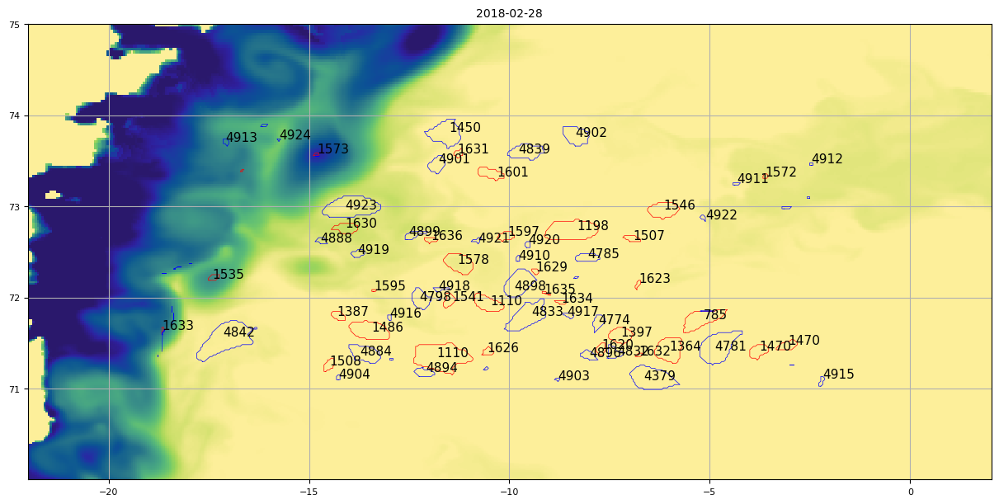

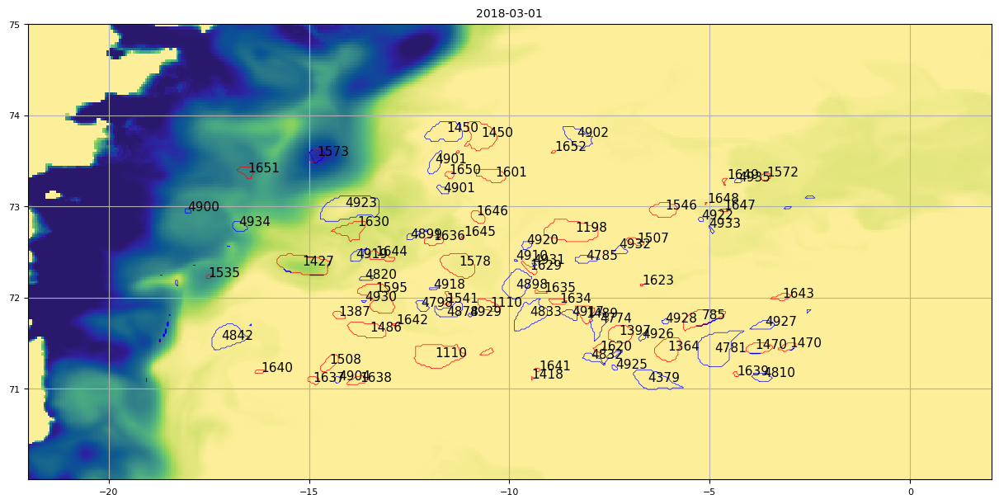

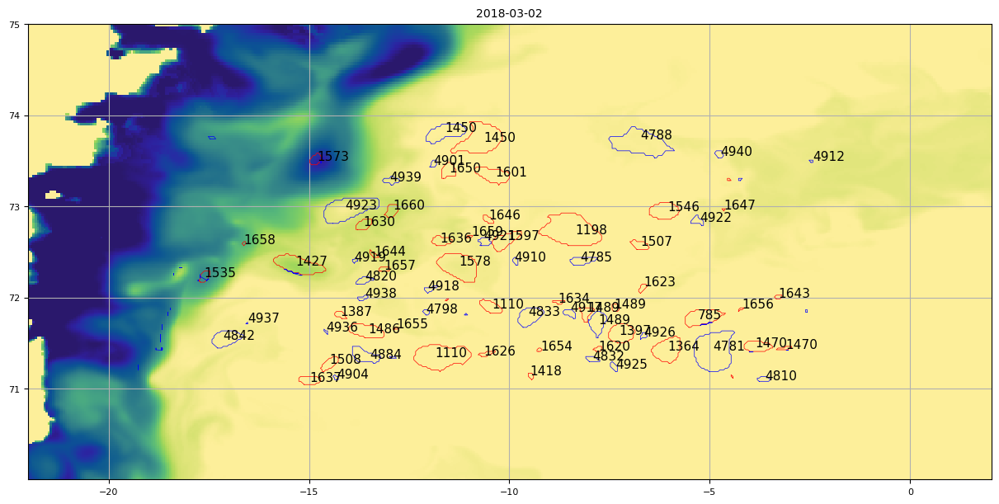

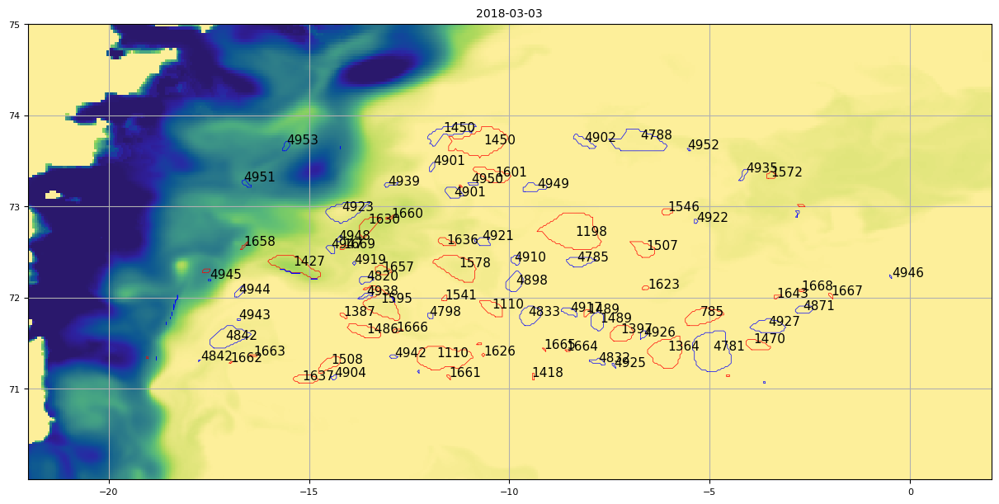

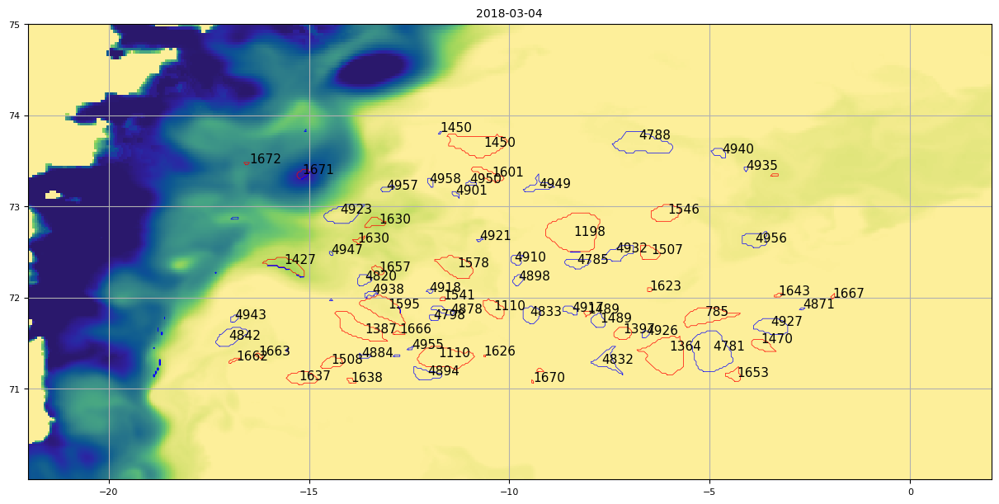

...

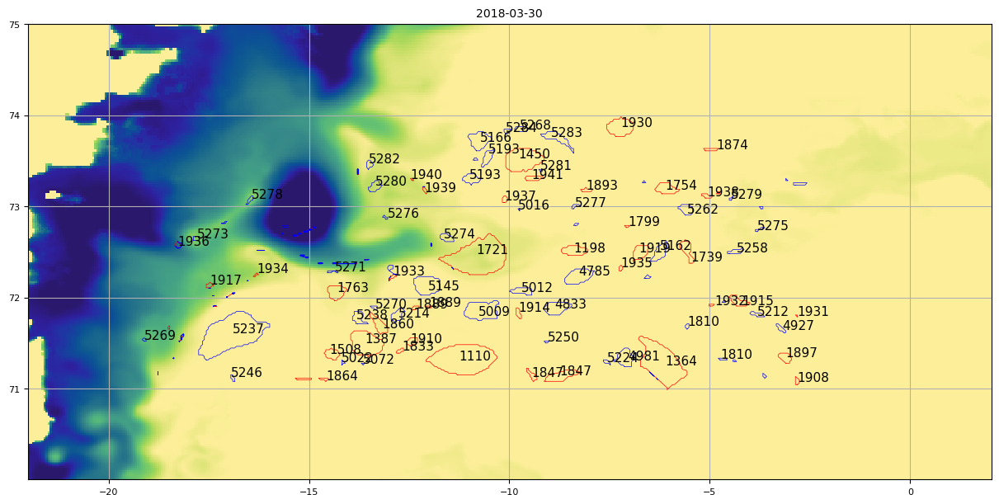

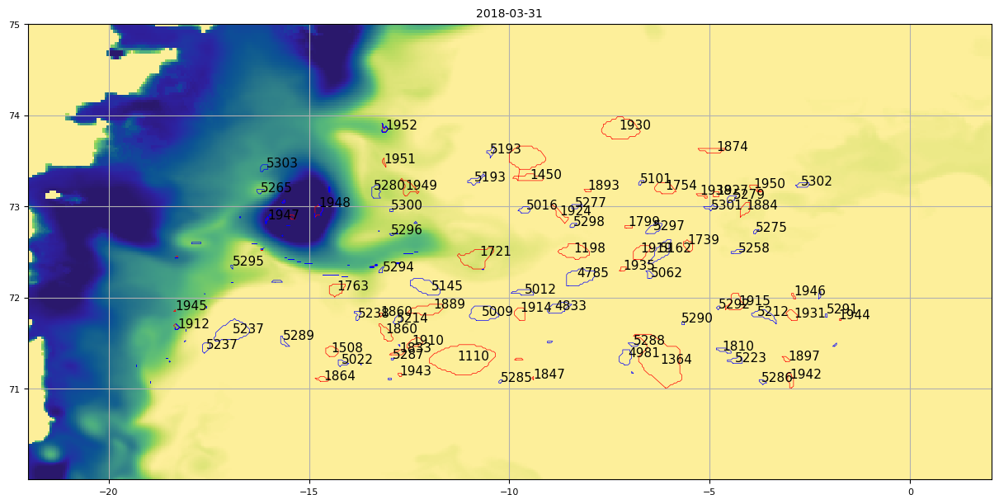

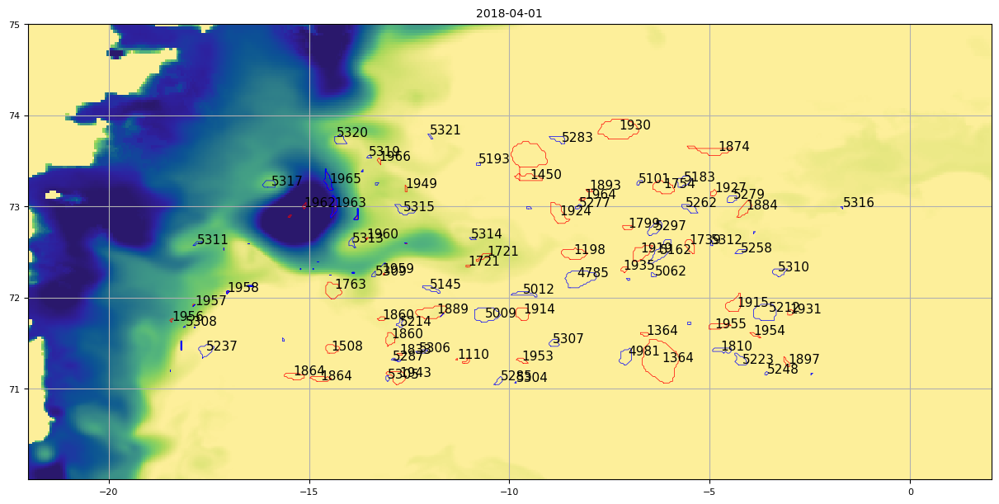

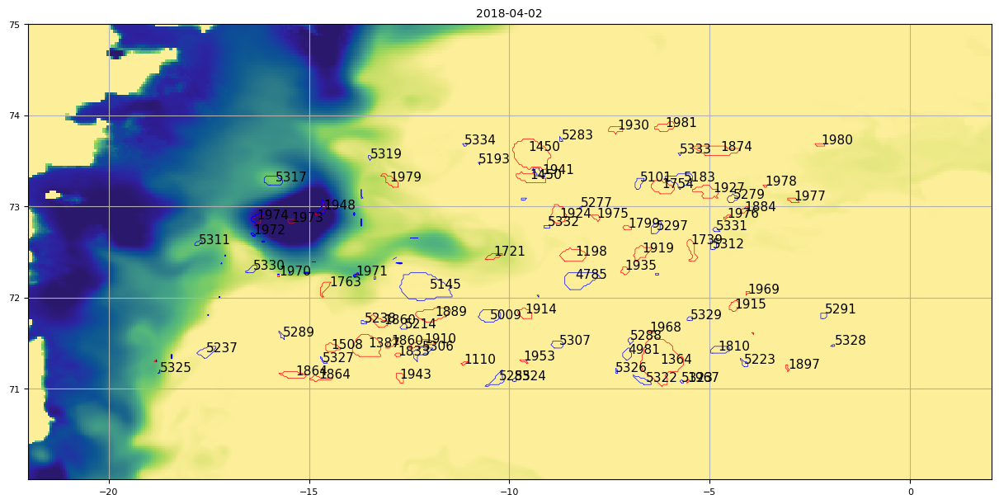

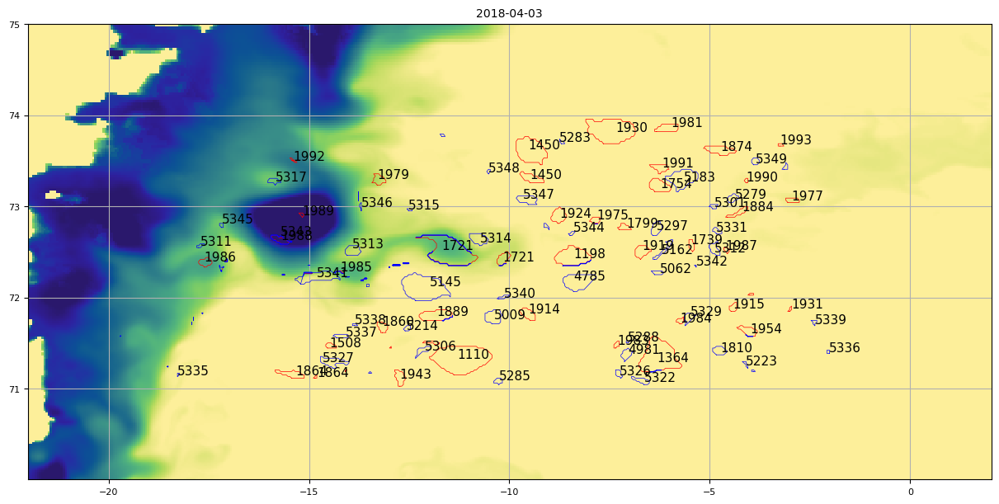

In [45]:
time_ = np.arange(180,215)
for time in time_:
    fig, ax = plt.subplots(
        figsize=(12,6),layout='constrained'
    )
    contour = ax.contourf(dfOWsurf.X,dfOWsurf.Y,dfOWsurf[time],[0,1],colors='white')
    ax.grid()
    all_contour_points = []

    for collection in contour.collections:
        for path in collection.get_paths():
            # Collect the vertices of the path
            vertices = path.vertices
            all_contour_points.append(vertices)

    processed_contour_segments = []
    for vertices in all_contour_points:
        segments = process_contour_path(vertices)
        processed_contour_segments.extend(segments)
    
    for vertices in processed_contour_segments:
        ax.plot(vertices[:, 0], vertices[:, 1], 'r-', linewidth=0.5)


    data_ID = eddies_ID_max_t_surf.at[time,'ID'].values
    data_LON = eddies_ID_max_t_surf.at[time,'Longitude'].values
    data_LAT = eddies_ID_max_t_surf.at[time,'Latitude'].values
    for i in range(len(data_ID)):
        for vertices in processed_contour_segments:
            region = Path(vertices)
            if region.contains_point((data_LON[i],data_LAT[i])):
                ax.annotate(str(int(data_ID[i])),[data_LON[i],data_LAT[i]])
    
    contour = ax.contourf(dfOWsurf.X,dfOWsurf.Y,dfOWsurf[time],[1.5,2],colors='white')

    all_contour_points = []

    for collection in contour.collections:
        for path in collection.get_paths():
            # Collect the vertices of the path
            vertices = path.vertices
            all_contour_points.append(vertices)

    processed_contour_segments = []
    for vertices in all_contour_points:
        segments = process_contour_path(vertices)
        processed_contour_segments.extend(segments)
    
    for vertices in processed_contour_segments:
        ax.plot(vertices[:, 0], vertices[:, 1], 'b-', linewidth=0.5)

    data_ID = eddies_ID_min_t_surf.at[time,'ID'].values
    data_LON = eddies_ID_min_t_surf.at[time,'Longitude'].values
    data_LAT = eddies_ID_min_t_surf.at[time,'Latitude'].values
    for i in range(len(data_ID)):
        for vertices in processed_contour_segments:
            region = Path(vertices)
            if region.contains_point((data_LON[i],data_LAT[i])):
                ax.annotate(str(int(data_ID[i])),[data_LON[i],data_LAT[i]])
    
    ax.pcolormesh(FWC.X,FWC.Y,FWC[time],cmap=cmo.haline_r,vmin=0,vmax=10)
    ax.set_title(str(FWC.time.values[time])[0:10])

<xarray.DataArray 'EddyDetection' (Y: 231, X: 510)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * X        (X) float64 -21.98 -21.93 -21.87 -21.82 ... 1.822 1.879 1.936 1.994
  * Y        (Y) float64 70.01 70.03 70.04 70.06 ... 74.89 74.92 74.95 74.99
    XC       (Y, X) float64 ...
    YC       (Y, X) float64 ...
    time     datetime64[ns] 2018-04-10
    Z        float64 ...
Attributes:
    long_name:      free-surface_r-anomaly
    units:          m
    standard_name:  sea_surface_height_above_geoid
    _coordinates:   XC YC iter

Text(0.5, 1.0, 'Vertical weighted mean OW')

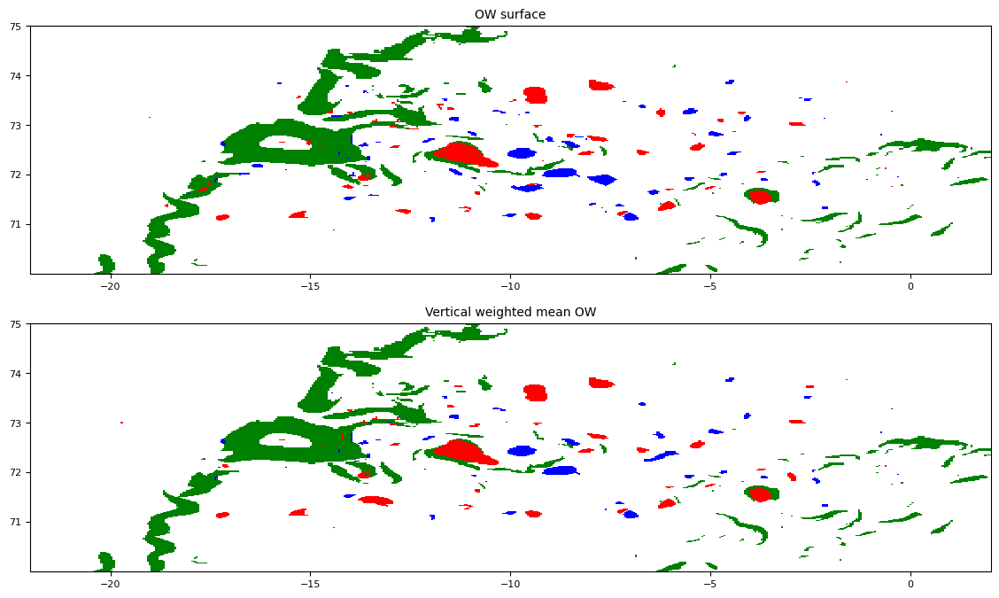

In [ ]:
fig, ax = plt.subplots(2,1,
figsize=(14,8)
)

# Define the custom colormap
colors = ['red', 'blue', 'yellow', 'green']
cmap = mcolors.ListedColormap(colors)

# Define the normalization
bounds = [0.5, 1.5, 2.5, 3.5, 4.5]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

ax[0].pcolormesh(dfOWsurf.X,dfOWsurf.Y,dfOWsurf,cmap=cmap,norm=norm)
ax[1].pcolormesh(dfOWWM.X,dfOWWM.Y,dfOWWM,cmap=cmap,norm=norm)

ax[0].set_title('OW surface')
ax[1].set_title('Vertical weighted mean OW')

In [52]:
np.unique([[[['1ba','2aa']]],[[['1bb','2ab']]]])

array(['1ba', '1bb', '2aa', '2ab'], dtype='<U3')